DIFFUSION INTERVENTIONS

In [1]:
from main import load, run
from interventions.ablate import AblationIntervention
from interventions.encoder import EncoderIntervention
from util import encode_prompt
import matplotlib.pyplot as plt

/share/u/imgr/miniconda3/envs/nnsight/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Keyword arguments {'trust_remote_code': True} are not expected by StableDiffusionPipeline and will be ignored.
Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

100%|██████████| 50/50 [00:08<00:00,  5.84it/s]


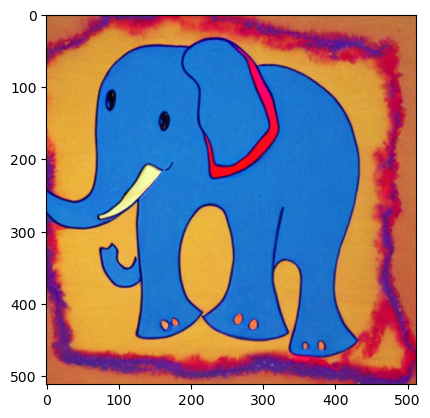

In [2]:
model = load()
model._model.pipeline.safety_checker = None
image = run(model, prompt="blue elephant", seed=40)
plt.imshow(image)

In [6]:
#LAYER PATHS IN THE RIGHT ORDER

my_self_layers =[
    '.unet.down_blocks.0.attentions.0.transformer_blocks.0.attn1',
    '.unet.down_blocks.0.attentions.1.transformer_blocks.0.attn1',
    '.unet.down_blocks.1.attentions.0.transformer_blocks.0.attn1',
    '.unet.down_blocks.1.attentions.1.transformer_blocks.0.attn1',
    '.unet.down_blocks.2.attentions.0.transformer_blocks.0.attn1',
    '.unet.down_blocks.2.attentions.1.transformer_blocks.0.attn1',
    '.unet.mid_block.attentions.0.transformer_blocks.0.attn1',
    '.unet.up_blocks.1.attentions.0.transformer_blocks.0.attn1',
    '.unet.up_blocks.1.attentions.1.transformer_blocks.0.attn1',
    '.unet.up_blocks.1.attentions.2.transformer_blocks.0.attn1',
    '.unet.up_blocks.2.attentions.0.transformer_blocks.0.attn1',
    '.unet.up_blocks.2.attentions.1.transformer_blocks.0.attn1',
    '.unet.up_blocks.2.attentions.2.transformer_blocks.0.attn1',
    '.unet.up_blocks.3.attentions.0.transformer_blocks.0.attn1',
    '.unet.up_blocks.3.attentions.1.transformer_blocks.0.attn1',
    '.unet.up_blocks.3.attentions.2.transformer_blocks.0.attn1'
]

my_cross_layers =[
    '.unet.down_blocks.0.attentions.0.transformer_blocks.0.attn2',
    '.unet.down_blocks.0.attentions.1.transformer_blocks.0.attn2',
    '.unet.down_blocks.1.attentions.0.transformer_blocks.0.attn2',
    '.unet.down_blocks.1.attentions.1.transformer_blocks.0.attn2',
    '.unet.down_blocks.2.attentions.0.transformer_blocks.0.attn2',
    '.unet.down_blocks.2.attentions.1.transformer_blocks.0.attn2',
    '.unet.mid_block.attentions.0.transformer_blocks.0.attn2',
    '.unet.up_blocks.1.attentions.0.transformer_blocks.0.attn2',
    '.unet.up_blocks.1.attentions.1.transformer_blocks.0.attn2',
    '.unet.up_blocks.1.attentions.2.transformer_blocks.0.attn2',
    '.unet.up_blocks.2.attentions.0.transformer_blocks.0.attn2',
    '.unet.up_blocks.2.attentions.1.transformer_blocks.0.attn2',
    '.unet.up_blocks.2.attentions.2.transformer_blocks.0.attn2',
    '.unet.up_blocks.3.attentions.0.transformer_blocks.0.attn2',
    '.unet.up_blocks.3.attentions.1.transformer_blocks.0.attn2',
    '.unet.up_blocks.3.attentions.2.transformer_blocks.0.attn2'
]

100%|██████████| 50/50 [00:05<00:00,  8.70it/s]


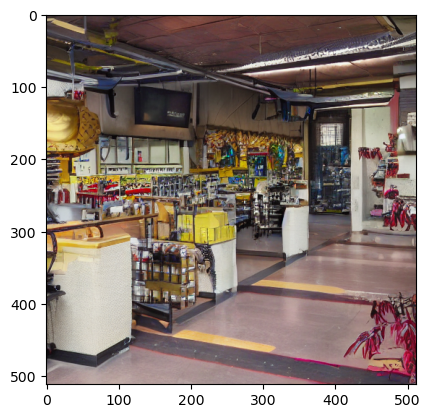

In [3]:
m=3
envoys = model._envoy.modules(lambda envoy : envoy._module_path.endswith('attn2'))# and envoy._module_path not in my_cross_layers[:6])

#intervention1 = AblationIntervention(envoys)

blank_embeds = encode_prompt(" ", model)
intervention2 = EncoderIntervention(blank_embeds, envoys)
    
image = run(model, prompt="blue elephant", seed=40, interventions=[intervention2])
    
plt.imshow(image)

LOOP FOR INTERVENTIONS INTO DIFFERENT LAYERS

100%|██████████| 50/50 [00:05<00:00,  8.47it/s]


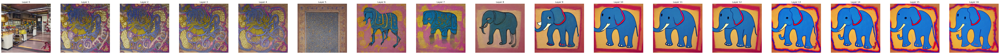

In [36]:
plt.figure(figsize=(100,20))
for m in range(17):
    
    envoys = model._envoy.modules(lambda envoy : envoy._module_path.endswith('attn2') and envoy._module_path not in my_cross_layers[:m])
    #intervention1 = AblationIntervention(envoys)
    
    blank_embeds = encode_prompt("", model)
    intervention2 = EncoderIntervention(blank_embeds, envoys)
    
    image = run(model, prompt="blue elephant", seed=40, interventions=[intervention2])
    plt.subplot(1, 17, m+1)
    plt.title(f"Layer {m}")
    plt.imshow(image)
    plt.axis('off')
plt.show
plt.savefig(f"systematic-outputs/40_blue-elephant/cross_creationpath_emptypr.png")

100%|██████████| 50/50 [00:05<00:00,  8.51it/s]


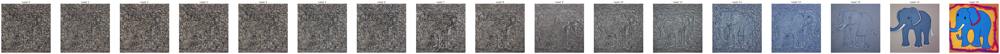

In [40]:
plt.figure(figsize=(100,20))
for m in range(17):
    
    envoys = model._envoy.modules(lambda envoy : (envoy._module_path.endswith('attn1') and envoy._module_path not in my_self_layers[:m]) or (envoy._module_path.endswith('attn2') and envoy._module_path not in my_cross_layers[:m]))
    intervention1 = AblationIntervention(envoys)
    
    # blank_embeds = encode_prompt("", model)
    # intervention2 = EncoderIntervention(blank_embeds, envoys)
    
    image = run(model, prompt="blue elephant", seed=40, interventions=[intervention1])
    plt.subplot(1, 17, m+1)
    plt.title(f"Layer {m}")
    plt.imshow(image)
    plt.axis('off')
plt.show
plt.savefig(f"systematic-outputs/40_blue-elephant/cross-self_creationpath_ablate.png")